In [1]:
import h5py 
import numpy as np
import pandas as pd
import SiFoN as sfn
import pyranges as pr
from SiFoN import viz
from SiFoN import chrom_viz as cviz
from SiFoN import GWAS_enrichment as enr

### Case study for the `viz` module

In this case, we have Sei predictions for the chr10:89580225-89633389 which is near the PTEN gene. `vcf` should be a .vcf file containing genomic coordinates and ref/alt identities for each SNP in your region of interest. The `file` should be a numpy array of sequence class scores, such that rows correspond to the rows in `vcf`. You can also select `TSS` or any other regions to label and denote in the graph. In this case, we make note of the Sheng PTEN Promoter.

In [2]:
file = "../brca2/PTEN/sequence_class_scores.npy"
vcf = pd.read_csv("../brca2/PTEN/chr10_89580225_89633389.vcf", 
                  header=None, sep="\t", 
                  names=["Chromosome", "Position", "SNP", "Ref", "Alt"])
wid = 400
PTEN_TSS = {
    'RefSeqTSS Promoter': [89623382 - wid, 89623382 + wid],
    'CLEVER FANTOM CAGE Promoter': [89623389 - wid, 89623389 + wid],
    'UCSC genome browser':[89623195 - wid, 89623195 + wid],
    'Sheng PTEN Promoter' : [89622930, 89624219]
}

Next, we use `plot_from_scores` to visualize the maximum predictions in this region. `filename` is the name of the output file. The `signed` parameter signals whether or not maximums are plotted as absolute values or not. `plot_by` should be "class" (the maximum scoring class out of all 40 sequence classes) or "category"  (the maximum within each category (e.g. E Enhancer, HET Heterochromatin, etc.))

In [22]:
viz.plot_from_scores(filename="test", file=file, vcf=vcf, TSS=PTEN_TSS, signed=False, plot_by="category")

You can also run the intermediate functions for this code to produce the same plots, in case you want to observe and manipulate the data at intermediate steps. If you do this, make sure that the `signed` parameter should be consistent across functions. 

Below are two examples. `find_max` takes the maximum scoring class out of all 40 sequence classes. `find_max_by_category` finds the maximum within each category (e.g. E Enhancer, HET Heterochromatin, etc.) The `signed` parameter again signals whether or not maximums are plotted as absolute values or not. 

In [23]:
scores_signed = viz.preprocess(file, vcf, signed=True)
max_scores_signed = viz.find_max(scores_signed.iloc[-30000:-5000, :], signed=True)
viz.plot_max("test", max_scores_signed, TSS=PTEN_TSS)

In [24]:
max_by_cat = viz.find_max_by_category(scores_signed, signed=True)
viz.plot_max("test", max_by_cat, TSS=PTEN_TSS)

### Case study for the `chrom_viz` module

First, we load in Sei data. This should include the output `row_labels.txt` file and the `diffs.h5` files. To get Sei results, either follow the directions on the GitHub (https://github.com/FunctionLab/sei-framework) or on HumanBase (https://hb.flatironinstitute.org/deepsea/).

In [6]:
row_labels = pd.read_csv("../chromatin_plot_library/chr10_89580225_89633389_row_labels.txt", header=0, sep="\t")
row_labels.head(1)

,chrom,pos,name,ref,alt,strand,ref_match,contains_unk
0,chr10,89580225,.,G,A,+,True,False


For any particular genomic loci (e.g. chr10:89623103), Sei outputs three scores corresponding to each potential alteration at that position (in this case: G>A, G>C, G>T). For this module, we want to focus on the alteration that has the highest predicted impact on regulatory function. The `preprocess_diff` function selects the alteration that has the highest average absolute score across all positions in the dataset. The `diff` array is then reduced to include only the highest SNP per position. The `row_labels` dataframe is adjusted accordingly. 

In [7]:
diff_h5 = h5py.File("../chromatin_plot_library/chr10_89580225_89633389_diffs.h5", 'r')
diff = np.array(diff_h5.get("data"))
diff_h5.close()
diff, row_labels = cviz.preprocess_diff(diff, row_labels)
print(diff.shape)

(53164, 21907)


Select a SNP of interest to study in further detail.

In [8]:
loc_index, loc, figname = 104, 89623103, "test.pdf"

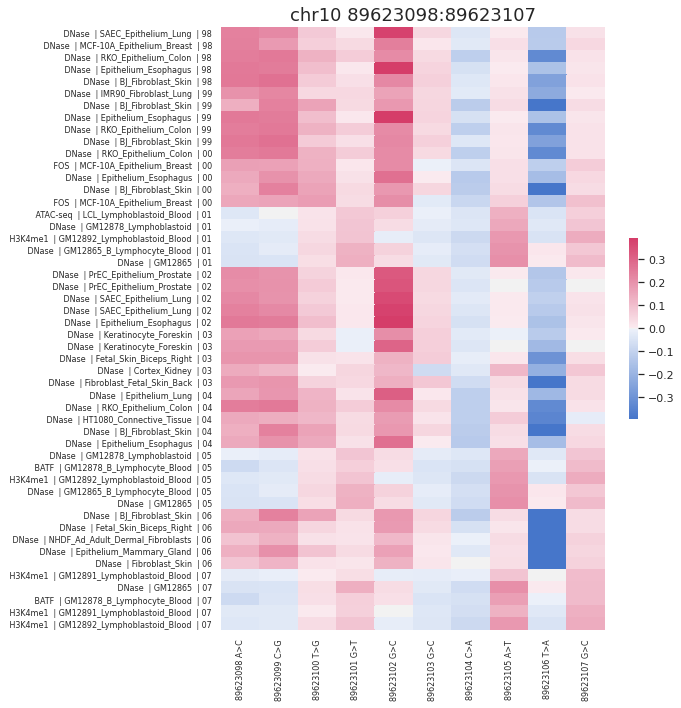

In [12]:
cviz.chromatin_profile_heatmap(diff, row_labels, loc, loc_index, figname, top_X=5, pos_window=5, fontsize=8)

In [10]:
cviz.rank_scatter_plot(diff, row_labels, loc, loc_index, figname, fontsize=18)

### Case study for `GWAS_enrichment`

The `ccvs` should be read in as a dataframe. Rows correspond to SNPs. It should have the columns 
* `Chromosome` : The chromosome of the risk loci
* `Start`: The left endpoint of your seqeucne
* `End` : The right endpoint of your sequence
* `SNP` : Identifies the risk loci. This could be any identifier you choose (e.g. the rsID or coordinates of the loci risk SNP). 

Additional columns are acceptable, but will not affect plotting

`output.bed` is a reference of Sei predictions across the hg19 genome. This file is available through SiFoN. If your `ccvs` file uses different genomic coordinates, either create your own reference BED file or convert your `ccvs` file to hg19.

In [2]:
ccvs = pd.read_csv("Zhang_S5.csv", header = 0)
ccvs.head(3)

,Chromosome,Start,End,MAF,P-value,SNP
0,chr1,109682901,110762901,0.12,2.600000e-08,rs5776993
1,chr2,67341757,68421757,0.26,4.800000e-08,rs9712235
2,chr2,68852128,69932128,0.45,2.000000e-09,rs4602255


/home/bmacedo/IW/SiFoN/src/SiFoN/GWAS_enrichment.py:43: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  g.ax_col_dendrogram.set_xlim([0,0])


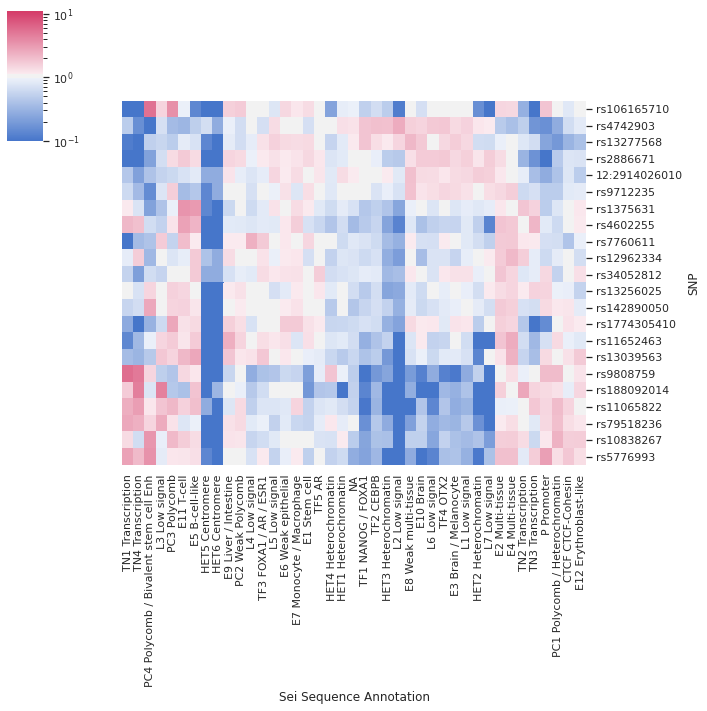

In [3]:
ref_bed = pr.read_bed("output.bed")
counts_in_loci = enr.find_enrichment(ccvs, ref_bed)
enr.plot_enrichment(counts_in_loci, "test.png")

### Case study for `construct_FASTA.py`

File format: #CHROM	POS	ID	REF	ALT